TINDER

In [157]:
import pandas as pd
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt

from collections import Counter

import requests
import json



Importation des datasets

In [ ]:
dataset = pd.read_csv("Speed+Dating+Data.csv", encoding="latin-1")
dataset.describe()

NameError: name 'pd' is not defined

On remarque (comme attendu) que toutes les colonnes ne sont pas rempli entièrement.
On va traiter les données manquantes:
    - Pour id, il suffit juste de rajouter le nombre 22 dans la case manquante
    - Pour les autres, on regardera au cas par cas

In [5]:
# dataset.loc[-1,"id"] = -1
dataset.describe()

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
count,8378.000000,8377.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,6532.000000,8378.000000,...,3974.000000,3974.000000,3974.000000,3974.000000,3974.000000,2016.000000,2016.000000,2016.000000,2016.000000,2016.000000
mean,283.675937,8.960248,0.500597,17.327166,1.828837,11.350919,16.872046,9.042731,9.295775,8.927668,...,7.240312,8.093357,8.388777,7.658782,7.391545,6.810020,7.615079,7.932540,7.155258,7.048611
std,158.583367,5.491329,0.500029,10.940735,0.376673,5.995903,4.358458,5.514939,5.650199,5.477009,...,1.576596,1.610309,1.459094,1.744670,1.961417,1.507341,1.504551,1.340868,1.672787,1.717988
min,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,5.000000,1.000000,1.000000,1.000000,...,2.000000,2.000000,3.000000,2.000000,1.000000,2.000000,2.000000,4.000000,1.000000,1.000000
25%,154.000000,4.000000,0.000000,8.000000,2.000000,7.000000,14.000000,4.000000,4.000000,4.000000,...,7.000000,7.000000,8.000000,7.000000,6.000000,6.000000,7.000000,7.000000,6.000000,6.000000
50%,281.000000,8.000000,1.000000,16.000000,2.000000,11.000000,18.000000,8.000000,9.000000,8.000000,...,7.000000,8.000000,8.000000,8.000000,8.000000,7.000000,8.000000,8.000000,7.000000,7.000000
75%,407.000000,13.000000,1.000000,26.000000,2.000000,15.000000,20.000000,13.000000,14.000000,13.000000,...,8.000000,9.000000,9.000000,9.000000,9.000000,8.000000,9.000000,9.000000,8.000000,8.000000
max,552.000000,22.000000,1.000000,44.000000,2.000000,21.000000,22.000000,22.000000,22.000000,22.000000,...,12.000000,12.000000,12.000000,12.000000,12.000000,10.000000,10.000000,10.000000,10.000000,10.000000


# Traitement des données brutes pour les répartir correctement

Séparation des dataframes par sous catégories

In [450]:
nb_q_speed_dating = 33
nb_q_signup_timel = 64
nb_q_scorecard = 11
nb_q_halfway_night = 11
nb_q_followup_time2 = 37
nb_q_followup_time3 = 39

start = 0
stop = nb_q_speed_dating
df_speed_dating = dataset.iloc[:,start:stop]

start = stop
stop += nb_q_signup_timel
df_signup_timel = dataset.iloc[:,start:stop]

start = stop
stop += nb_q_scorecard
df_scorecard = dataset.iloc[:,start:stop]

start = stop
stop += nb_q_halfway_night
df_halfway_night = dataset.iloc[:,start:stop]

start = stop
stop += nb_q_followup_time2
df_followup_time2 = dataset.iloc[:,start:stop]

start = stop
stop += nb_q_followup_time3
df_followup_time3 = dataset.iloc[:,start:stop]


In [407]:
df_halfway_night.describe(include='all')

,attr1_s,sinc1_s,intel1_s,fun1_s,amb1_s,shar1_s,attr3_s,sinc3_s,intel3_s,fun3_s,amb3_s
count,4096.000000,4096.000000,4096.000000,4096.000000,4096.000000,4096.000000,4000.00000,4000.000000,4000.000000,4000.000000,4000.000000
mean,20.791624,15.434255,17.243708,15.260869,11.144619,12.457925,7.21125,8.082000,8.257750,7.692500,7.589250
std,12.968524,6.915322,6.596420,5.356969,5.514028,5.921789,1.41545,1.455741,1.179317,1.626839,1.793136
min,3.000000,0.000000,0.000000,1.000000,0.000000,0.000000,3.00000,1.000000,4.000000,3.000000,2.000000
25%,14.810000,10.000000,10.000000,10.000000,7.000000,9.000000,7.00000,7.000000,8.000000,7.000000,7.000000
50%,17.650000,15.790000,18.420000,15.910000,10.000000,12.500000,7.00000,8.000000,8.000000,8.000000,8.000000
75%,25.000000,20.000000,20.000000,20.000000,15.000000,16.280000,8.00000,9.000000,9.000000,9.000000,9.000000
max,95.000000,50.000000,40.000000,40.000000,23.810000,30.000000,10.00000,10.000000,10.000000,10.000000,10.000000


In [8]:
df_speed_dating.describe(include='all')

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o
count,8378.000000,8377.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,6532.000000,8378.000000,...,8378.000000,8166.000000,8091.000000,8072.000000,8018.000000,7656.000000,7302.000000,8128.000000,8060.000000,7993.000000
mean,283.675937,8.960248,0.500597,17.327166,1.828837,11.350919,16.872046,9.042731,9.295775,8.927668,...,0.419551,6.190411,7.175256,7.369301,6.400599,6.778409,5.474870,6.134498,5.208251,1.960215
std,158.583367,5.491329,0.500029,10.940735,0.376673,5.995903,4.358458,5.514939,5.650199,5.477009,...,0.493515,1.950305,1.740575,1.550501,1.954078,1.794080,2.156163,1.841258,2.129354,0.245925
min,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,5.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,154.000000,4.000000,0.000000,8.000000,2.000000,7.000000,14.000000,4.000000,4.000000,4.000000,...,0.000000,5.000000,6.000000,6.000000,5.000000,6.000000,4.000000,5.000000,4.000000,2.000000
50%,281.000000,8.000000,1.000000,16.000000,2.000000,11.000000,18.000000,8.000000,9.000000,8.000000,...,0.000000,6.000000,7.000000,7.000000,7.000000,7.000000,6.000000,6.000000,5.000000,2.000000
75%,407.000000,13.000000,1.000000,26.000000,2.000000,15.000000,20.000000,13.000000,14.000000,13.000000,...,1.000000,8.000000,8.000000,8.000000,8.000000,8.000000,7.000000,7.000000,7.000000,2.000000
max,552.000000,22.000000,1.000000,44.000000,2.000000,21.000000,22.000000,22.000000,22.000000,22.000000,...,1.000000,10.500000,10.000000,10.000000,11.000000,10.000000,10.000000,10.000000,10.000000,8.000000


In [391]:
nb_person = df_speed_dating['iid'].max()
nb_person
nb__date_male = (df_speed_dating['gender'] == 1).sum()
nb__date_female = (df_speed_dating['gender'] == 0).sum()
nb_male = df_speed_dating[df_speed_dating['gender'] == 1]['iid'].nunique()
nb_female = df_speed_dating[df_speed_dating['gender'] == 0]['iid'].nunique()
nb_female


274

# Manipulation de la partie 1: Speed dating

In [10]:
dict_field = {
    1: "Law",
    2: "Math",
    3: "Social Science, Psychologist",
    4: "Medical Science, Pharmaceuticals, and Bio Tech",
    5: "Engineering",
    6: "English/Creative Writing/Journalism",
    7: "History/Religion/Philosophy",
    8: "Business/Econ/Finance",
    9: "Education, Academia",
    10: "Biological Sciences/Chemistry/Physics",
    11: "Social Work",
    12: "Undergrad/undecided",
    13: "Political Science/International Affairs",
    14: "Film",
    15: "Fine Arts/Arts Administration",
    16: "Languages",
    17: "Architecture",
    18: "Other"
}

dict_race = {
    1: "Black/African American",
    2: "European/Caucasian-American",
    3: "Latino/Hispanic American",
    4: "Asian/Pacific Islander/Asian-American",
    5: "Native American",
    6: "Other"
}

list_activities = ["sports", "tvsports", "exercise", "dining", "museums", "art", "hiking", "gaming", "clubbing", "reading", "tv", "theater", "movies", "concerts", "music", "shopping", "yoga"]

# Manipulation de la partie 2: Signup/Time 1

    Création d'un dataframe simple

In [11]:
# Création d'un fonction qui permettra d'extraire d'un df une valeur par personne.
def extraction_df(df_in: pd.DataFrame) -> pd.DataFrame:
    df_out = pd.concat([df_speed_dating['iid'],df_in], axis = 1)

    return df_out


In [12]:
# On regarde si la catégorie age est complete
df_signup_timel['age'].describe() 

# On remplace les valeurs manquantes en prenant l'age correspondant à chaque iid. Si la donnée est manquante, on rentre l'âge manquant. Si tout l'iid est vide, on mettra la valeur moyenne.
df_age = extraction_df(df_signup_timel['age'])
df_age_unique = df_age.groupby('iid').mean()




In [13]:
# Je crée un dataframe df_field_sex comportant l'âge, le genre et la domaine de travail
df_field_sex = pd.concat([df_signup_timel['field'],df_speed_dating['gender'],df_signup_timel['age']], axis = 1)
df_field_sex = extraction_df(df_field_sex)

# Je remplace dans la catégorie Sex, les valeurs numériques par les labels correspondant
df_field_sex['gender_label'] = df_field_sex['gender'].map({1: 'Male', 0: 'Female'})
df_field_sex_unique = df_field_sex.drop_duplicates(subset='iid', keep='first')

df_field_sex.describe(include='all')

,iid,field,gender,age,gender_label
count,8378.000000,8315,8378.000000,8283.000000,8378
unique,NaN,259,NaN,NaN,2
top,NaN,Business,NaN,NaN,Male
freq,NaN,521,NaN,NaN,4194
mean,283.675937,NaN,0.500597,26.358928,NaN
std,158.583367,NaN,0.500029,3.566763,NaN
min,1.000000,NaN,0.000000,18.000000,NaN
25%,154.000000,NaN,0.000000,24.000000,NaN
50%,281.000000,NaN,1.000000,26.000000,NaN
75%,407.000000,NaN,1.000000,28.000000,NaN


In [14]:
df_field_sex.head()

,iid,field,gender,age,gender_label
0,1,Law,0,21.0,Female
1,1,Law,0,21.0,Female
2,1,Law,0,21.0,Female
3,1,Law,0,21.0,Female
4,1,Law,0,21.0,Female


In [15]:
df_signup_timel['gender'] = df_speed_dating['gender']
df_signup_timel['gender_label'] = df_field_sex['gender_label']
df_signup_timel['race_label'] = df_signup_timel['race'].map(dict_race)

    Simplification de la colonne "Field of study"

In [49]:
# La colonne "field" contient trop de données différentes. Je transforme les données où le field_cd == 18 en "Other"
df_signup_timel.loc[:,'field_cd']= df_signup_timel.fillna(18)
for i in range(18):
    df_signup_timel.loc[df_signup_timel['field_cd'] == (i+1), 'field'] = dict_field[i+1]


    Traitement des activities

In [50]:
# On vient ici mettre les valeurs hors gabarits à la valeur moyenne

df_activities = df_signup_timel.loc[:,list_activities]
column_mean = df_activities.mean()

for column in list_activities:
    # df_activities.loc[(df_activities[column]> 10),column] = column_mean[column]
    df_activities.loc[(df_activities[column]> 10),column] = column_mean[column]

for column in list_activities:
    df_activities.loc[(df_activities[column] < 0),column] = column_mean[column]


In [18]:
# Plot des activities pour avoir une idée de l'intéret des personnes pour les activités proposées
fig = px.box(df_activities)
fig.update_layout(xaxis_categoryorder='total descending')
fig.show()

    Répartition des âges en fonctions du genre

In [19]:
df_field_sex_unique.describe()

,iid,gender,age
count,551.000000,551.000000,543.000000
mean,276.787659,0.502722,26.359116
std,159.494486,0.500447,3.766960
min,1.000000,0.000000,18.000000
25%,139.500000,0.000000,24.000000
50%,277.000000,1.000000,26.000000
75%,414.500000,1.000000,28.000000
max,552.000000,1.000000,55.000000


In [20]:
# On regarde la répartition des âge en fonction du genre
fig = px.histogram(df_field_sex_unique, x = "age", color = "gender_label",text_auto=True)
fig.show()

    Répartition du domaine d'étude en fonction du genre

In [51]:
# Cartographie des domaines d'activités
fig = px.histogram(df_field_sex_unique,
                    x = "field",
                      color = 'gender_label',
                      text_auto=True,
                      )
# Mise à jour de la disposition pour trier les catégories
fig.update_layout(xaxis_categoryorder='total descending')
fig.show()

    Répartition des origines ethniques

In [22]:
# Répartition des origines ethniques
df_ethnical_origin = extraction_df(pd.concat([df_signup_timel["race_label"],
                                              df_signup_timel["gender"],
                                              df_field_sex["gender_label"]],
                                              axis=1))

df_ethnical_origin = df_ethnical_origin.drop_duplicates(subset='iid', keep='first')
df_ethnical_origin.describe()
fig = px.histogram(df_ethnical_origin,
                    x = "race_label",
                      color = 'gender_label',
                      text_auto=True,
                      )
fig.show()

# Visualisation de l'importance de certains paramètres 

    Origine ethnique

In [ ]:
# Importance de l'origine ethnique
fig = px.histogram(df_signup_timel,
                    x = "imprace",
                      color = 'gender_label',
                      text_auto=True,
                      
                      )
fig.show()



L'origine ethnique importe peu les personnes

    Religion

In [24]:
# Importance de l'origine religieuse
df_religion_origin = extraction_df(pd.concat([df_signup_timel["imprelig"],
                                              df_signup_timel["gender"],
                                              df_field_sex["gender_label"]],
                                              axis=1))

df_religion_origin = df_religion_origin.drop_duplicates(subset='iid', keep='first')
df_religion_origin.describe()
fig = px.histogram(df_religion_origin,
                    x = "imprelig",
                      color = 'gender_label',
                      text_auto=True,
                      
                      )
fig.show()

Même remarque concernant la religion

Objectif des personnes sur Tinder

In [25]:
# Quels sont les objectifs des personnes ?
df_goal = extraction_df(pd.concat([df_signup_timel["goal"],
                                              df_signup_timel["gender"],
                                              df_field_sex["gender_label"]],
                                              axis=1))

df_goal = df_goal.drop_duplicates(subset='iid', keep='first')
df_goal.describe()
fig = px.histogram(df_goal, x = "goal",color = 'gender_label', text_auto=True)
fig.show()

Les personnes sur Tinder recherchent plutôt des histoires sans lendemain (Classe 1) et rencontrer de nouvelles personnes (Classe 2), qu'importe le genre de la personne

In [494]:
# On a demandé aux personnes de donner des notes à propos de diverses questions.
# Selon la vague à laquelle les personnes apprtiennent, le système employé n'était pas le même (points ou échelle). Je décide donc de séparer selon le type de notation les dataframes
# Je ne traite que la partie points car le système d'échelle possède des valeurs qui ne correspondent pas à la consigne.
mask = (df_speed_dating["wave"] >= 6) & (df_speed_dating["wave"] <= 9)

list_column_to_save = []
dict_attributes = {}
for i in range(5):
    dict_attributes["attr"+str(i+1)+"_1"] = "Attractive"
    dict_attributes["sinc"+str(i+1)+"_1"] = "Sincere" 
    dict_attributes["intel"+str(i+1)+"_1"] = "Intelligent"
    dict_attributes["fun"+str(i+1)+"_1"] = "Fun"
    dict_attributes["amb"+str(i+1)+"_1"] = "Ambitious"

    if ((i+1)!=3 and (i+1)!=5):
        list_column_to_save.append(["attr"+str(i+1)+"_1","sinc"+str(i+1)+"_1","intel"+str(i+1)+"_1","fun"+str(i+1)+"_1","amb"+str(i+1)+"_1","shar"+str(i+1)+"_1"])
        dict_attributes["shar"+str(i+1)+"_1"] = "Shared interests"
        
    else:
        list_column_to_save.append(["attr"+str(i+1)+"_1","sinc"+str(i+1)+"_1","intel"+str(i+1)+"_1","fun"+str(i+1)+"_1","amb"+str(i+1)+"_1"])

df_speed_dating_reduce_point = df_speed_dating['iid'][~mask]

# what you look for in the opposite sex
column_to_save = list_column_to_save[0]
df_scale_personal_think = df_signup_timel[mask].loc[:,column_to_save]
df_points_personal_think = df_signup_timel[~mask].loc[:,column_to_save]
df_date_note_time1 = df_signup_timel.loc[:,column_to_save]


# What do you think the opposite sex looks for
column_to_save = list_column_to_save[1]
df_scale_opposite_think = df_signup_timel[mask].loc[:,column_to_save]
df_points_opposite_think = df_signup_timel[~mask].loc[:,column_to_save]


# How do you think you measure up?
column_to_save = list_column_to_save[2]
df_scale_measure_up = df_signup_timel[mask].loc[:,column_to_save]
df_points_measure_up = df_signup_timel[~mask].loc[:,column_to_save]


# what you think MOST of your fellow men/women look for
column_to_save = list_column_to_save[3]
df_scale_global_think = df_signup_timel[mask].loc[:,column_to_save]
df_points_global_think = df_signup_timel[~mask].loc[:,column_to_save]


# how do you think others perceive you
column_to_save = list_column_to_save[4]
df_scale_other_perception = df_signup_timel[mask].loc[:,column_to_save]
df_points_other_perception = df_signup_timel[~mask].loc[:,column_to_save]


for col in df_scale_personal_think.columns:
    df_scale_personal_think = df_scale_personal_think.rename(columns={col:dict_attributes[col]})
    df_points_personal_think = df_points_personal_think.rename(columns={col:dict_attributes[col]})

for col in df_points_global_think.columns:
    df_scale_global_think = df_scale_global_think.rename(columns={col:dict_attributes[col]})
    df_points_global_think = df_points_global_think.rename(columns={col:dict_attributes[col]})

for col in df_points_opposite_think.columns:
    df_scale_opposite_think = df_scale_opposite_think.rename(columns={col:dict_attributes[col]})
    df_points_opposite_think = df_points_opposite_think.rename(columns={col:dict_attributes[col]})

for col in df_points_measure_up.columns:
    df_scale_measure_up = df_scale_measure_up.rename(columns={col:dict_attributes[col]})
    df_points_measure_up = df_points_measure_up.rename(columns={col:dict_attributes[col]})

for col in df_points_other_perception.columns:
    df_scale_other_perception = df_scale_other_perception.rename(columns={col:dict_attributes[col]})
    df_points_other_perception = df_points_other_perception.rename(columns={col:dict_attributes[col]})

df_points_personal_think = pd.concat([df_speed_dating_reduce_point,df_points_personal_think], axis = 1).drop_duplicates(subset='iid', keep='first').drop('iid',axis=1)
df_points_opposite_think = pd.concat([df_speed_dating_reduce_point,df_points_opposite_think], axis = 1).drop_duplicates(subset='iid', keep='first').drop('iid',axis=1)
df_points_measure_up = pd.concat([df_speed_dating_reduce_point,df_points_measure_up], axis = 1).drop_duplicates(subset='iid', keep='first').drop('iid',axis=1)
df_points_global_think = pd.concat([df_speed_dating_reduce_point,df_points_global_think], axis = 1).drop_duplicates(subset='iid', keep='first').drop('iid',axis=1)
df_points_other_perception = pd.concat([df_speed_dating_reduce_point,df_points_other_perception], axis = 1).drop_duplicates(subset='iid', keep='first').drop('iid',axis=1)

In [27]:
df_points_personal_think.describe()

,Attractive,Sincere,Intelligent,Fun,Ambitious,Shared interests
count,443.000000,443.000000,443.000000,442.000000,441.000000,440.000000
mean,24.166704,17.135598,20.466117,17.354344,9.908753,11.250500
std,13.857936,7.870302,7.533931,6.766943,6.284687,6.803424
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15.000000,10.000000,17.000000,12.250000,5.000000,5.000000
50%,20.000000,19.000000,20.000000,18.090000,10.000000,10.000000
75%,30.000000,20.000000,25.000000,20.000000,15.000000,15.000000
max,100.000000,60.000000,50.000000,50.000000,53.000000,30.000000


    What you look for in the opposite sex

In [28]:
fig = px.box(df_points_personal_think)
fig.update_layout(xaxis_categoryorder='total descending')
fig.show()

Le côté attractif d'une personne est l'attribut qui divise le plus(IQR le plus grand et moustache les plus allongées). Ce n'est pas étonnant si on prend en compte que la plupart des personnes recherchent une histoire sans lendemain...
A l'inverse, les personnes semblent relativement tous d'accord sur la partie "Fun".

    Analyse de la répartition des points pour chaque attribut

In [29]:
# Define the order of columns for the subplots
column_order = ['Attractive', 'Intelligent', 'Fun', 'Sincere', 'Shared interests','Ambitious']

# Create a figure with 3 rows and 2 columns
fig = make_subplots(rows=3, cols=2,subplot_titles=column_order)


# Add histograms to each subplot
row = 1
col = 1
for i, column in enumerate(column_order):
    fig.add_trace(go.Histogram(x=df_points_personal_think[column], name=column,nbinsx=100), row=row, col=col)
    if col == 2:
        row += 1
        col = 1
    else:
        col += 1

# Update layout for better readability
fig.update_layout(
    title_text="Distributions of Ratings",
    showlegend=True,
    height=600,
    width=800
)


for i in range(3):
    for j in range(3):
        fig.update_xaxes(range=[0, 100], row=i+1, col=j+1)

# Show the plot
fig.show()

Ce graphe corrobore les box visualisées ci-dessus

    Superposition de la répartition des attributs en fonction:
        - Ce que recherche les personnes
        - Ce que les personnes pensent que les autres personnes du même sexe recherchent

In [30]:
# # Define the order of columns for the subplots
# column_order = ['Attractive', 'Intelligent', 'Fun', 'Sincere','Shared interests','Ambitious']

# df_names = ["Personal_think", "Global_think", "Opposite_think", "Measure_up"]
# colors = ['blue', 'red', 'green', 'black']  # Define a list of colors


# nb_row = len(df_names)/2
# nb_col = 2

# # Create a figure with 3 rows and 2 columns
# fig = make_subplots(rows=3, cols=2,subplot_titles=column_order)
# row = 1
# col = 1
# for i, column in enumerate(column_order):
#     for j, df in enumerate([df_points_personal_think, df_points_global_think, df_points_opposite_think, df_points_measure_up]):
#         show_legend = False
#         if df_names[j] == 'Attractive':
#             show_legend = True  # On affiche la légende uniquement pour "Attractive"
#         fig.add_trace(
#             go.Histogram(
#                 x=df[column],  
#                 name=f"{column}_{j}",  # Add a suffix to the name for better identification
#                 marker=dict(color=colors[j]),
#                 showlegend=show_legend
#             ), 
#             row=row, 
#             col=col
#         )
#     col += 1
#     if col > 2:
#         row += 1
#         col = 1


# # Update layout for better readability
# fig.update_layout(
#     title_text="Distributions of Ratings",
#     showlegend=True,
#     height=600,
#     width=800
# )

# for i in range(3):
#     for j in range(3):
#         fig.update_xaxes(range=[0, 100], row=i+1, col=j+1)

# # Show the plot
# fig.show()

What you look for in the opposite sex
    df_points_personal_think
What do you think the opposite sex looks for
    df_points_opposite_think
How do you think you measure up?
    df_points_measure_up
What you think MOST of your fellow men/women look for
    df_points_global_think
How do you think others perceive you
    df_points_other_perception

In [31]:
# Define the order of columns for the subplots
cas = 3

if cas == 1:
    column_order = ['Attractive', 'Intelligent', 'Fun', 'Sincere','Ambitious']
    df_names = ["Measure_up", "Other_perception"]

if cas == 2:
    column_order = ['Attractive', 'Intelligent', 'Fun', 'Sincere','Shared interests','Ambitious']
    df_names = ["Personal_think", "Opposite_think"]

if cas == 3:
    column_order = ['Attractive', 'Intelligent', 'Fun', 'Sincere','Shared interests','Ambitious']
    df_names = ["Personal_think", "Global_think"]





df_dict = {"Personal_think":df_points_personal_think,
           "Global_think":df_points_global_think,
           "Opposite_think":df_points_opposite_think,
           "Other_perception":df_points_other_perception,
           "Measure_up":df_points_measure_up
}

colors = ['orange', 'red', 'green', 'blue']  # Define a list of colors
# df_list = [[df_points_personal_think, df_points_global_think, df_points_opposite_think, df_points_other_perception],[df_points_personal_think, df_points_global_think, df_points_opposite_think]]
fig = [go.Figure(),go.Figure(),go.Figure(),go.Figure(),go.Figure(),go.Figure()] 

for j, column in enumerate(column_order):
    for i, df in enumerate(df_names):
        fig[j].add_trace(go.Histogram(
            x=df_dict[df][column],
            name=df_names[i],
            marker_color=colors[i],
            xbins=dict(size=20)
        ))
    fig[j].update_layout(title_text=column)
    fig[j].update_xaxes(range=[0, 100])
    fig[j].show()
        

# Manipulation de scorecard

In [32]:
df_scorecard = extraction_df(df_scorecard)
df_scorecard.describe(include="all")

,iid,dec,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es
count,8378.000000,8378.000000,8176.000000,8101.000000,8082.000000,8028.000000,7666.000000,7311.000000,8138.000000,8069.000000,8003.000000,7205.000000
mean,283.675937,0.419909,6.189995,7.175164,7.368597,6.400598,6.777524,5.474559,6.134087,5.207523,0.948769,3.207814
std,158.583367,0.493573,1.950169,1.740315,1.550453,1.953702,1.794055,2.156363,1.841285,2.129565,0.989889,2.444813
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,154.000000,0.000000,5.000000,6.000000,6.000000,5.000000,6.000000,4.000000,5.000000,4.000000,0.000000,2.000000
50%,281.000000,0.000000,6.000000,7.000000,7.000000,7.000000,7.000000,6.000000,6.000000,5.000000,0.000000,3.000000
75%,407.000000,1.000000,8.000000,8.000000,8.000000,8.000000,8.000000,7.000000,7.000000,7.000000,2.000000,4.000000
max,552.000000,1.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,8.000000,18.000000


Normalement, toutes les catégories devraient avoir le même nombre de réponse.

    Répartition selon l'objectif:
Il est évident que selon l'objectif de chaque personne, les critères de sélection ne seront pas les mêmes. C'est pourquoi je fais des sous divisions selon l'objectifs des personnes.

In [33]:
list_attributes = ['attr','sinc','intel','fun','amb','shar']
list_attributes_norm = ['attr_norm','sinc_norm','intel_norm','fun_norm','amb_norm','shar_norm']

df_signup_timel.loc[:,'field_cd']= df_signup_timel.fillna(18)

# On réunit df_scorecard et goal
df_scorecard['goal'] = df_signup_timel['goal']
for idx, elmnt in enumerate(list_attributes):
    df_scorecard.loc[:,elmnt] = df_scorecard.fillna(df_scorecard.loc[:,elmnt].mean())


# One night people
mask = (df_scorecard['goal'] == 1)
df_one_night_people = df_scorecard[mask]

# Meeting new people
mask = (df_scorecard['goal'] == 2)
df_meeting_np = df_scorecard[mask]

# Other
mask = (df_scorecard['goal'] != 1) & (df_scorecard['goal'] != 2) 
df_other_goal = df_scorecard[mask]



In [34]:
df_scorecard.describe()

,iid,dec,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,goal
count,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8138.000000,8069.000000,8003.000000,7205.000000,8299.000000
mean,283.675937,0.419909,6.189995,7.175164,7.368597,6.400598,6.777524,5.474559,6.134087,5.207523,0.948769,3.207814,2.122063
std,158.583367,0.493573,1.926513,1.711300,1.522814,1.912453,1.716119,2.014356,1.841285,2.129565,0.989889,2.444813,1.407181
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,154.000000,0.000000,5.000000,6.000000,7.000000,5.000000,6.000000,4.000000,5.000000,4.000000,0.000000,2.000000,1.000000
50%,281.000000,0.000000,6.000000,7.000000,7.368597,6.400598,7.000000,5.474559,6.000000,5.000000,0.000000,3.000000,2.000000
75%,407.000000,1.000000,8.000000,8.000000,8.000000,8.000000,8.000000,7.000000,7.000000,7.000000,2.000000,4.000000,2.000000
max,552.000000,1.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,8.000000,18.000000,6.000000


    Examination n°1
On va regarder pour chaque iid, les notes données et la décision de revoir ou non.

In [35]:
# Je décide de sommer les notes de chaque attributs

df_one_night_people.head()


,iid,dec,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,goal
10,2,0,5.0,7.0,8.0,4.0,6.0,3.0,6.0,4.0,2.0,3.0,1.0
11,2,0,8.0,5.0,6.0,6.0,9.0,6.0,7.0,3.0,2.0,3.0,1.0
12,2,0,5.0,8.0,9.0,6.0,3.0,4.0,6.0,7.0,2.0,3.0,1.0
13,2,1,7.0,9.0,7.0,6.0,5.0,7.0,7.0,8.0,2.0,3.0,1.0
14,2,0,6.0,8.0,7.0,9.0,7.0,8.0,8.0,6.0,1.0,3.0,1.0


In [36]:
import plotly.figure_factory as ff
df_names = ["One_night", "Meet_people","Other"]
colors = ['orange', 'red', 'green']  # Define a list of colors

for elmnt in list_attributes:
  # Create distplot with curve_type set to 'normal'
  fig = ff.create_distplot([df_one_night_people[elmnt],
                            df_meeting_np[elmnt],
                            df_other_goal[elmnt]],
                              df_names, bin_size=.5,
                          curve_type='normal',
                          show_hist=False,
                          colors=colors)

  # Add title
  fig.update_layout(title_text=elmnt)
  fig.show()

In [37]:
# Define the order of columns for the subplots

column_order = ['Attractive', 'Intelligent', 'Fun', 'Sincere','Shared interests','Ambitious']
df_names = ["One_night", "Meet_people","Other"]

df_dict = {"One_night":df_one_night_people,
           "Meet_people":df_meeting_np,
           "Other":df_other_goal
}

colors = ['orange', 'red', 'green', 'blue']  # Define a list of colors
fig = [go.Figure(),go.Figure(),go.Figure(),go.Figure(),go.Figure(),go.Figure()] 

for j, column in enumerate(list_attributes):
    for i, df in enumerate(df_names):
        fig[j].add_trace(go.Histogram(
            x=df_dict[df][column],
            name=df_names[i],
            marker_color=colors[i]
        ))
    fig[j].update_layout(title_text=column)
    fig[j].update_xaxes(range=[0, 10])
    fig[j].show()
        

In [38]:
df_scorecard.head()

,iid,dec,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,goal
0,1,1,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,2.0
1,1,1,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,2.0
2,1,1,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,2.0
3,1,1,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,2.0
4,1,1,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,2.0


In [39]:
# # Calcul de la valeur minimale de la note globale lorsque la décision est "OUI"
# mask = (df_scorecard["dec"] == 1) 
# df_scorecard_match = df_scorecard[mask]
# note_min_match = df_scorecard_match.groupby('iid')['note'].min()

# # Calcul de la valeur minimale de la note globale lorsque la décision est "NON"
# df_scorecard_no_match = df_scorecard[~mask]
# note_max_no_match = df_scorecard_match.groupby('iid')['note'].max()

    Résultat:
La note minimale globale entrainant un "OUI" est inférieure à la note globale maximale entrainant un "NON".
Je suppose qu'il y a des notes sur certains attributs qui prévalent sur d'autres

In [40]:
# comparaison_note = (note_min_match - note_max_no_match) > 0
# comparaison_note.value_counts()

    Corrélation entre ce que croit chaque personne vs comment ils notent

In [41]:
list_attributes_personnal_think = []
for elmnt in list_attributes:
    list_attributes_personnal_think.append(elmnt + "1_1")


In [42]:
# df_scorecard = df_scorecard.drop(index = -1, axis = 0)
df_scorecard

,iid,dec,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,goal
0,1,1,6.0,9.0,7.0,7.0,6.000000,5.000000,7.0,6.0,2.0,4.0,2.0
1,1,1,7.0,8.0,7.0,8.0,5.000000,6.000000,7.0,5.0,1.0,4.0,2.0
2,1,1,5.0,8.0,9.0,8.0,5.000000,7.000000,7.0,NaN,1.0,4.0,2.0
3,1,1,7.0,6.0,8.0,7.0,6.000000,8.000000,7.0,6.0,2.0,4.0,2.0
4,1,1,5.0,6.0,7.0,7.0,6.000000,6.000000,6.0,6.0,2.0,4.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8373,552,0,3.0,5.0,5.0,5.0,6.777524,5.474559,2.0,5.0,0.0,3.0,1.0
8374,552,0,4.0,6.0,8.0,4.0,4.000000,5.474559,4.0,4.0,0.0,3.0,1.0
8375,552,0,4.0,7.0,8.0,8.0,8.000000,5.474559,6.0,5.0,0.0,3.0,1.0
8376,552,0,4.0,6.0,5.0,4.0,6.777524,5.000000,5.0,5.0,0.0,3.0,1.0


In [57]:
# df_temp = extraction_df(df_speed_dating['gender'])
df_temp = (df_speed_dating['gender'])
df_attributes = df_signup_timel.loc[:,list_attributes_personnal_think]
df_temp = pd.concat([df_temp,df_attributes],axis=1)
df_temp = pd.concat([df_temp,df_scorecard],axis=1)

In [56]:
df_attributes

,attr1_1,sinc1_1,intel1_1,fun1_1,amb1_1,shar1_1
0,15.0,20.0,20.0,15.0,15.0,15.0
1,15.0,20.0,20.0,15.0,15.0,15.0
2,15.0,20.0,20.0,15.0,15.0,15.0
3,15.0,20.0,20.0,15.0,15.0,15.0
4,15.0,20.0,20.0,15.0,15.0,15.0
...,...,...,...,...,...,...
8373,70.0,0.0,15.0,15.0,0.0,0.0
8374,70.0,0.0,15.0,15.0,0.0,0.0
8375,70.0,0.0,15.0,15.0,0.0,0.0
8376,70.0,0.0,15.0,15.0,0.0,0.0


In [58]:
# On sépare homme/femme
df_male_female = df_temp
mask_male = df_temp["gender"] == 1
df_male = df_temp[mask_male]
mask_female = df_temp["gender"] == 0
df_female = df_temp[mask_female]

In [59]:
df_male_match = df_male[df_male["dec"] == 1]
df_male_no_match = df_male[df_male["dec"] == 0]

In [60]:
df_male_female

,gender,attr1_1,sinc1_1,intel1_1,fun1_1,amb1_1,shar1_1,iid,dec,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,goal
0,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,6.0,9.0,7.0,7.0,6.000000,5.000000,7.0,6.0,2.0,4.0,2.0
1,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,7.0,8.0,7.0,8.0,5.000000,6.000000,7.0,5.0,1.0,4.0,2.0
2,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,5.0,8.0,9.0,8.0,5.000000,7.000000,7.0,NaN,1.0,4.0,2.0
3,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,7.0,6.0,8.0,7.0,6.000000,8.000000,7.0,6.0,2.0,4.0,2.0
4,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,5.0,6.0,7.0,7.0,6.000000,6.000000,6.0,6.0,2.0,4.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8373,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,3.0,5.0,5.0,5.0,6.777524,5.474559,2.0,5.0,0.0,3.0,1.0
8374,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,4.0,6.0,8.0,4.0,4.000000,5.474559,4.0,4.0,0.0,3.0,1.0
8375,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,4.0,7.0,8.0,8.0,8.000000,5.474559,6.0,5.0,0.0,3.0,1.0
8376,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,4.0,6.0,5.0,4.0,6.777524,5.000000,5.0,5.0,0.0,3.0,1.0


In [61]:
df_male

,gender,attr1_1,sinc1_1,intel1_1,fun1_1,amb1_1,shar1_1,iid,dec,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,goal
100,1,35.0,20.0,20.0,20.0,0.0,5.0,11,0,6.0,8.0,8.0,8.0,8.000000,6.000000,7.0,4.0,2.0,0.0,1.0
101,1,35.0,20.0,20.0,20.0,0.0,5.0,11,0,8.0,7.0,6.0,9.0,7.000000,4.000000,7.0,2.0,2.0,0.0,1.0
102,1,35.0,20.0,20.0,20.0,0.0,5.0,11,0,7.0,8.0,6.0,5.0,8.000000,4.000000,5.0,2.0,1.0,0.0,1.0
103,1,35.0,20.0,20.0,20.0,0.0,5.0,11,0,6.0,7.0,8.0,7.0,7.000000,5.000000,6.0,3.0,2.0,0.0,1.0
104,1,35.0,20.0,20.0,20.0,0.0,5.0,11,0,6.0,8.0,8.0,8.0,7.000000,6.000000,6.0,5.0,2.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8373,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,3.0,5.0,5.0,5.0,6.777524,5.474559,2.0,5.0,0.0,3.0,1.0
8374,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,4.0,6.0,8.0,4.0,4.000000,5.474559,4.0,4.0,0.0,3.0,1.0
8375,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,4.0,7.0,8.0,8.0,8.000000,5.474559,6.0,5.0,0.0,3.0,1.0
8376,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,4.0,6.0,5.0,4.0,6.777524,5.000000,5.0,5.0,0.0,3.0,1.0


In [62]:
df_male_grouped = df_male.groupby('iid')

In [63]:
df_male_grouped.head(20)

,gender,attr1_1,sinc1_1,intel1_1,fun1_1,amb1_1,shar1_1,iid,dec,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,goal
100,1,35.0,20.0,20.0,20.0,0.0,5.0,11,0,6.0,8.0,8.0,8.0,8.000000,6.000000,7.0,4.0,2.0,0.0,1.0
101,1,35.0,20.0,20.0,20.0,0.0,5.0,11,0,8.0,7.0,6.0,9.0,7.000000,4.000000,7.0,2.0,2.0,0.0,1.0
102,1,35.0,20.0,20.0,20.0,0.0,5.0,11,0,7.0,8.0,6.0,5.0,8.000000,4.000000,5.0,2.0,1.0,0.0,1.0
103,1,35.0,20.0,20.0,20.0,0.0,5.0,11,0,6.0,7.0,8.0,7.0,7.000000,5.000000,6.0,3.0,2.0,0.0,1.0
104,1,35.0,20.0,20.0,20.0,0.0,5.0,11,0,6.0,8.0,8.0,8.0,7.000000,6.000000,6.0,5.0,2.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8371,1,70.0,0.0,15.0,15.0,0.0,0.0,552,1,8.0,7.0,8.0,8.0,6.777524,5.474559,7.0,6.0,0.0,3.0,1.0
8372,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,7.0,5.0,5.0,5.0,6.000000,5.474559,4.0,4.0,0.0,3.0,1.0
8373,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,3.0,5.0,5.0,5.0,6.777524,5.474559,2.0,5.0,0.0,3.0,1.0
8374,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,4.0,6.0,8.0,4.0,4.000000,5.474559,4.0,4.0,0.0,3.0,1.0


In [117]:
df_std_attribute = df_male_female.loc[:,list_attributes].std(axis = 1)
df_std_attribute = pd.DataFrame({"std":df_std_attribute})
df_mean_attribute = df_male_female.loc[:,list_attributes].mean(axis = 1)
df_mean_attribute = pd.DataFrame({"mean":df_mean_attribute})
df_male_female = pd.concat([df_male_female,df_std_attribute,df_mean_attribute], axis = 1)
    

In [118]:
df_male_female

,gender,attr1_1,sinc1_1,intel1_1,fun1_1,amb1_1,shar1_1,iid,dec,attr,...,fun,amb,shar,like,prob,met,match_es,goal,std,mean
0,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,6.0,...,7.0,6.000000,5.000000,7.0,6.0,2.0,4.0,2.0,1.366260,6.666667
1,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,7.0,...,8.0,5.000000,6.000000,7.0,5.0,1.0,4.0,2.0,1.169045,6.833333
2,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,5.0,...,8.0,5.000000,7.000000,7.0,NaN,1.0,4.0,2.0,1.673320,7.000000
3,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,7.0,...,7.0,6.000000,8.000000,7.0,6.0,2.0,4.0,2.0,0.894427,7.000000
4,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,5.0,...,7.0,6.000000,6.000000,6.0,6.0,2.0,4.0,2.0,0.752773,6.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8373,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,3.0,...,5.0,6.777524,5.474559,2.0,5.0,0.0,3.0,1.0,1.214431,5.042014
8374,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,4.0,...,4.0,4.000000,5.474559,4.0,4.0,0.0,3.0,1.0,1.603921,5.245760
8375,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,4.0,...,8.0,8.000000,5.474559,6.0,5.0,0.0,3.0,1.0,1.669679,6.745760
8376,1,70.0,0.0,15.0,15.0,0.0,0.0,552,0,4.0,...,4.0,6.777524,5.000000,5.0,5.0,0.0,3.0,1.0,1.100803,5.129587


In [65]:
df_comp = pd.concat([df_std_attribute,df_mean_attribute,df_male_female['like'],df_male_female['dec']], axis= 1)
df_comp = extraction_df(df_comp)

In [109]:
# Séparation homme femme
df_comp_male = df_comp[mask_male]
df_comp_female = df_comp[mask_female]

In [ ]:
# Séparation dec = 0 ou 1
df_comp_male_dec0 = df_comp_male[df_male["dec"] == 0]
df_comp_male_dec1 = df_comp_male[df_male["dec"] == 1]
df_comp_female_dec0 = df_comp_female[df_female["dec"] == 0]
df_comp_female_dec1 = df_comp_female[df_female["dec"] == 1]

On isole les hommes qui ont décidé de revoir leur date. On regarde la distribution.

In [69]:
median_sum_attributes = df_comp_male['like'].median()
median_sum_attributes

6.0

In [85]:
median_like_male_dec1 = df_comp_male_dec1['like'].median()
df_comp_male_dec1_under_median = df_comp_male_dec1[df_comp_male_dec1['like'] < median_like_male_dec1]
df_comp_male_dec1_above_median = df_comp_male_dec1[df_comp_male_dec1['like'] >= median_like_male_dec1]
df_comp_male_dec1_under_median

,iid,std,mean,like,dec
142,15,1.695044,7.042014,6.0,1
149,15,1.503755,7.412426,6.0,1
152,16,0.408248,6.166667,6.0,1
153,16,0.752773,6.833333,6.0,1
155,16,0.983192,7.166667,6.0,1
...,...,...,...,...,...
8308,549,1.032796,6.666667,6.0,1
8313,550,0.516398,4.666667,5.0,1
8321,550,1.048809,5.500000,6.0,1
8324,550,0.516398,5.666667,6.0,1


On va regarder le pourcentage de OUI en fonction de la note globale

In [115]:
nb_total_male_dec1 = df_comp_male_dec1.shape[0]
nb_total_female_dec1 = df_comp_female_dec1.shape[0]

nb_total_male_dec0 = df_comp_male_dec0.shape[0]
nb_total_female_dec0 = df_comp_female_dec0.shape[0]
# print("Pourcentage de OUI avec une note inférieure à 5: " + str(100*round((df_comp_male_dec1[df_comp_male_dec1["mean"] <= 5].shape[0])/nb_total,4))+ "%")
print("HOMME:")
for i in range(11):
    print(f"Pourcentage de OUI avec une note comprise entre {i} et {i+1}: " + str(100*round((df_comp_male_dec1[(df_comp_male_dec1["mean"] >= i)&(df_comp_male_dec1["mean"] < i+1)].shape[0])/nb_total_male_dec1,3))+ "%")

print("FEMME:")
for i in range(11):
    print(f"Pourcentage de OUI avec une note comprise entre {i} et {i+1}: " + str(100*round((df_comp_female_dec1[(df_comp_female_dec1["mean"] >= i)&(df_comp_female_dec1["mean"] < i+1)].shape[0])/nb_total_female_dec1,3))+ "%")

print("HOMME:")
for i in range(11):
    print(f"Pourcentage de NON avec une note comprise entre {i} et {i+1}: " + str(100*round((df_comp_male_dec0[(df_comp_male_dec0["mean"] >= i)&(df_comp_male_dec0["mean"] < i+1)].shape[0])/nb_total_male_dec0,3))+ "%")

print("FEMME:")
for i in range(11):
    print(f"Pourcentage de NON avec une note comprise entre {i} et {i+1}: " + str(100*round((df_comp_female_dec0[(df_comp_female_dec0["mean"] >= i)&(df_comp_female_dec0["mean"] < i+1)].shape[0])/nb_total_female_dec0,3))+ "%")


HOMME:
Pourcentage de OUI avec une note comprise entre 0 et 1: 0.0%
Pourcentage de OUI avec une note comprise entre 1 et 2: 0.0%
Pourcentage de OUI avec une note comprise entre 2 et 3: 0.0%
Pourcentage de OUI avec une note comprise entre 3 et 4: 0.4%
Pourcentage de OUI avec une note comprise entre 4 et 5: 1.6%
Pourcentage de OUI avec une note comprise entre 5 et 6: 9.4%
Pourcentage de OUI avec une note comprise entre 6 et 7: 28.299999999999997%
Pourcentage de OUI avec une note comprise entre 7 et 8: 37.0%
Pourcentage de OUI avec une note comprise entre 8 et 9: 16.7%
Pourcentage de OUI avec une note comprise entre 9 et 10: 4.6%
Pourcentage de OUI avec une note comprise entre 10 et 11: 2.1%
FEMME:
Pourcentage de OUI avec une note comprise entre 0 et 1: 0.0%
Pourcentage de OUI avec une note comprise entre 1 et 2: 0.0%
Pourcentage de OUI avec une note comprise entre 2 et 3: 0.1%
Pourcentage de OUI avec une note comprise entre 3 et 4: 0.4%
Pourcentage de OUI avec une note comprise entre 4 e

Si la note est supérieure à 6, forte chance d'avoir un oui (homme et femme)

Pour df_comp_male_dec1_under_median, la note globale est inférieure à 7 (strictement). On va essayer de comprendre pourquoi vouloir revoir la personne.
1. On va regarder la répartition de la valeur moyenne de la somme des attributs
2. On va regarder la'écart type des notes

In [83]:
med = df_comp_male_dec1_under_median['mean'].median()
mean = df_comp_male_dec1_under_median['mean'].mean()
std = df_comp_male_dec1_under_median['mean'].std()

print("Médiane: " + str(med))
print("Std: " + str(std))
print("Q1: " + str(mean - std))
print("Q3: " + str(mean + std))

Médiane: 6.333333333333333
Std: 0.944984612441168
Q1: 5.32306942690294
Q3: 7.213038651785276


In [88]:
# Répartition de la note globale moyenne
fig = px.histogram(df_comp_male_dec1_under_median,
                    x = "mean",
                      # color = 'like',
                      text_auto=True,
                      nbins=20
                      
                      )
fig.update_xaxes(range=[0, 10])
fig.show()
fig = px.histogram(df_comp_male_dec1_above_median,
                    x = "mean",
                      # color = 'like',
                      text_auto=True,
                      nbins=20
                      
                      )
fig.update_xaxes(range=[0, 10])
fig.show()

La note médiane est de 6,3 et 68% des notes sont comprises entre 5,3 et 7,2

In [89]:
# Répartition de l'écart type globale
fig = px.histogram(df_comp_male_dec1_under_median,
                    x = "std",
                      # color = 'like',
                      text_auto=True,
                      nbins=20
                      
                      )
fig.show()
fig = px.histogram(df_comp_male_dec1_above_median,
                    x = "std",
                      # color = 'like',
                      text_auto=True,
                      nbins=20
                      
                      )
fig.show()

On observe globalement le même comportement de variation des notes, quelque soit la note globale.

    Vérification déclaration attributs

On va regarder si les déclarations concernant l'attribut le plus important correspond bien à la note qui prédomine

In [138]:
def get_max_cols(row):
    max_val = row.max()
    return row[row == max_val].index.tolist()

def get_min_cols(row):
    min_val = row.min()
    return row[row == min_val].index.tolist()

In [127]:
df_male_female["Ecart_max"] = df_male_female.loc[:,list_attributes].max(axis=1) - df_male_female.loc[:,list_attributes].min(axis=1)

In [315]:
df_male_female["High_note_attributes"] = df_male_female.loc[:,list_attributes].apply(get_max_cols, axis = 1)
df_male_female["Low_note_attributes"] = df_male_female.loc[:,list_attributes].apply(get_min_cols, axis = 1)
df_male_female["Best_attributes"] = df_male_female.loc[:,list_attributes_personnal_think].apply(get_max_cols, axis = 1)
df_male_female["Worst_attributes"] = df_male_female.loc[:,list_attributes_personnal_think].apply(get_min_cols, axis = 1)
# df_male_female["High_note_attributes"] = df_male_female.loc[:,list_attributes].idxmax(axis = 1)
# df_male_female["Low_note_attributes"] = df_male_female.loc[:,list_attributes].idxmin(axis = 1)
# df_male_female["Best_attributes"] = df_male_female.loc[:,list_attributes_personnal_think].idxmax(axis = 1)
# df_male_female["Worst_attributes"] = df_male_female.loc[:,list_attributes_personnal_think].idxmin(axis = 1)

In [316]:
df_male_female.head(10)

,gender,attr1_1,sinc1_1,intel1_1,fun1_1,amb1_1,shar1_1,iid,dec,attr,...,met,match_es,goal,std,mean,Ecart_max,High_note_attributes,Low_note_attributes,Best_attributes,Worst_attributes
0,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,6.0,...,2.0,4.0,2.0,1.366260,6.666667,4.0,[sinc],[shar],"[sinc1_1, intel1_1]","[attr1_1, fun1_1, amb1_1, shar1_1]"
1,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,7.0,...,1.0,4.0,2.0,1.169045,6.833333,3.0,"[sinc, fun]",[amb],"[sinc1_1, intel1_1]","[attr1_1, fun1_1, amb1_1, shar1_1]"
2,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,5.0,...,1.0,4.0,2.0,1.673320,7.000000,4.0,[intel],"[attr, amb]","[sinc1_1, intel1_1]","[attr1_1, fun1_1, amb1_1, shar1_1]"
3,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,7.0,...,2.0,4.0,2.0,0.894427,7.000000,2.0,"[intel, shar]","[sinc, amb]","[sinc1_1, intel1_1]","[attr1_1, fun1_1, amb1_1, shar1_1]"
4,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,5.0,...,2.0,4.0,2.0,0.752773,6.166667,2.0,"[intel, fun]",[attr],"[sinc1_1, intel1_1]","[attr1_1, fun1_1, amb1_1, shar1_1]"
5,0,15.0,20.0,20.0,15.0,15.0,15.0,1,0,4.0,...,2.0,4.0,2.0,2.065591,5.666667,5.0,[sinc],"[attr, fun, shar]","[sinc1_1, intel1_1]","[attr1_1, fun1_1, amb1_1, shar1_1]"
6,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,7.0,...,2.0,4.0,2.0,1.169045,6.166667,3.0,"[attr, intel, shar]",[fun],"[sinc1_1, intel1_1]","[attr1_1, fun1_1, amb1_1, shar1_1]"
7,0,15.0,20.0,20.0,15.0,15.0,15.0,1,0,4.0,...,NaN,4.0,2.0,1.722401,6.166667,5.0,[sinc],[attr],"[sinc1_1, intel1_1]","[attr1_1, fun1_1, amb1_1, shar1_1]"
8,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,7.0,...,2.0,4.0,2.0,1.032796,7.666667,3.0,[fun],[sinc],"[sinc1_1, intel1_1]","[attr1_1, fun1_1, amb1_1, shar1_1]"
9,0,15.0,20.0,20.0,15.0,15.0,15.0,1,1,5.0,...,2.0,4.0,2.0,1.834848,7.166667,5.0,[amb],[attr],"[sinc1_1, intel1_1]","[attr1_1, fun1_1, amb1_1, shar1_1]"


In [191]:
def counter_words(df: pd.DataFrame, column:str):
    # Extract the relevant columns
    df_selected = df.loc[:,column]
    values = df_selected.value_counts()

    return dict(values)

In [190]:
test = df_male_female["High_note_attributes"].value_counts()
test

High_note_attributes
sinc     2891
attr     2246
intel    1866
amb       632
fun       519
shar      224
Name: count, dtype: int64

In [262]:
dict_nb_attribute_high = {}
dict_nb_attribute_low = {}

df_male_female_grouped = df_male_female.groupby('iid')
columns_to_count = ['High_note_attributes', 'Low_note_attributes']

for iid, group in df_male_female_grouped:
    dict_nb_attribute_high[iid] = counter_words(group,columns_to_count[0])
    dict_nb_attribute_low[iid] = counter_words(group,columns_to_count[1])

In [274]:
df_nb_attribute_high = pd.DataFrame.from_dict(dict_nb_attribute_high,orient="index").fillna(0).reset_index(drop=True)
df_nb_attribute_low = pd.DataFrame.from_dict(dict_nb_attribute_low,orient="index").fillna(0).reset_index(drop=True)

df_nb_attribute_high

,sinc,intel,attr,fun,amb,shar
0,4.0,3.0,1.0,1.0,1.0,0.0
1,1.0,3.0,1.0,2.0,3.0,0.0
2,4.0,3.0,3.0,0.0,0.0,0.0
3,6.0,3.0,0.0,1.0,0.0,0.0
4,1.0,3.0,2.0,0.0,0.0,4.0
...,...,...,...,...,...,...
546,0.0,0.0,10.0,0.0,0.0,0.0
547,0.0,0.0,10.0,1.0,0.0,8.0
548,0.0,0.0,18.0,0.0,0.0,0.0
549,0.0,0.0,21.0,0.0,0.0,0.0


In [297]:
df_think_vs_note = df_male_female.loc[:,list_attributes_personnal_think]
df_think_vs_note = extraction_df(df_think_vs_note)
df_think_vs_note = df_think_vs_note.drop_duplicates(subset='iid', keep='first').reset_index(drop=True)

for column in df_think_vs_note.columns:
    new_name = column.replace('1_1','')
    df_think_vs_note = df_think_vs_note.rename(columns={column:new_name})
df_think_vs_note["Best_attribute"] = df_think_vs_note.iloc[:,2:].idxmax(axis = 1)

C:\Users\marce\AppData\Local\Temp\ipykernel_21008\2511077480.py:8: FutureWarning:

The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError



In [298]:
df_think_vs_note

,iid,attr,sinc,intel,fun,amb,shar,Best_attribute
0,1,15.0,20.0,20.0,15.0,15.0,15.0,sinc
1,2,45.0,5.0,25.0,20.0,0.0,5.0,intel
2,3,35.0,10.0,35.0,10.0,10.0,0.0,intel
3,4,20.0,20.0,20.0,20.0,10.0,10.0,sinc
4,5,20.0,5.0,25.0,25.0,10.0,15.0,intel
...,...,...,...,...,...,...,...,...
546,548,40.0,10.0,20.0,10.0,0.0,20.0,intel
547,549,20.0,20.0,20.0,20.0,0.0,20.0,sinc
548,550,30.0,3.0,30.0,30.0,3.0,4.0,intel
549,551,40.0,20.0,20.0,20.0,0.0,0.0,sinc


In [301]:
df_comp_think_vs_note = pd.concat([df_think_vs_note['iid'],df_think_vs_note["Best_attribute"]],axis=1)
df_comp_think_vs_note

,iid,Best_attribute
0,1,sinc
1,2,intel
2,3,intel
3,4,sinc
4,5,intel
...,...,...
546,548,intel
547,549,sinc
548,550,intel
549,551,sinc


In [303]:
df_think_vs_note = pd.concat([df_think_vs_note,df_nb_attribute_high],axis = 1)

In [302]:
df_nb_attribute_high

,sinc,intel,attr,fun,amb,shar
0,4.0,3.0,1.0,1.0,1.0,0.0
1,1.0,3.0,1.0,2.0,3.0,0.0
2,4.0,3.0,3.0,0.0,0.0,0.0
3,6.0,3.0,0.0,1.0,0.0,0.0
4,1.0,3.0,2.0,0.0,0.0,4.0
...,...,...,...,...,...,...
546,0.0,0.0,10.0,0.0,0.0,0.0
547,0.0,0.0,10.0,1.0,0.0,8.0
548,0.0,0.0,18.0,0.0,0.0,0.0
549,0.0,0.0,21.0,0.0,0.0,0.0


In [304]:
df_think_vs_note

,iid,attr,sinc,intel,fun,amb,shar,Best_attribute,sinc,intel,attr,fun,amb,shar
0,1,15.0,20.0,20.0,15.0,15.0,15.0,sinc,4.0,3.0,1.0,1.0,1.0,0.0
1,2,45.0,5.0,25.0,20.0,0.0,5.0,intel,1.0,3.0,1.0,2.0,3.0,0.0
2,3,35.0,10.0,35.0,10.0,10.0,0.0,intel,4.0,3.0,3.0,0.0,0.0,0.0
3,4,20.0,20.0,20.0,20.0,10.0,10.0,sinc,6.0,3.0,0.0,1.0,0.0,0.0
4,5,20.0,5.0,25.0,25.0,10.0,15.0,intel,1.0,3.0,2.0,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
546,548,40.0,10.0,20.0,10.0,0.0,20.0,intel,0.0,0.0,10.0,0.0,0.0,0.0
547,549,20.0,20.0,20.0,20.0,0.0,20.0,sinc,0.0,0.0,10.0,1.0,0.0,8.0
548,550,30.0,3.0,30.0,30.0,3.0,4.0,intel,0.0,0.0,18.0,0.0,0.0,0.0
549,551,40.0,20.0,20.0,20.0,0.0,0.0,sinc,0.0,0.0,21.0,0.0,0.0,0.0


In [311]:
df_comparaison = pd.concat([df_think_vs_note['iid'],df_think_vs_note.loc[:,'Best_attribute']],axis=1)

In [324]:
def remplacer_mot(liste,mot_in, mot_out):
    return [word.replace(mot_in, mot_out) for word in liste]

In [348]:
list_column = ['iid',"High_note_attributes","Low_note_attributes","Best_attributes","Worst_attributes","dec"]
df_comparaison = pd.concat([df_male_female.loc[:,list_column]],axis=1)
for idx,word in enumerate(list_attributes_personnal_think):
    df_comparaison.loc[:,"Best_attributes"] = df_comparaison.loc[:,"Best_attributes"].apply(remplacer_mot, args=(word,list_attributes[idx]))
    df_comparaison.loc[:,"Worst_attributes"] = df_comparaison.loc[:,"Worst_attributes"].apply(remplacer_mot, args=(word,list_attributes[idx]))



In [349]:
df_comparaison.head(5)

,iid,High_note_attributes,Low_note_attributes,Best_attributes,Worst_attributes,dec
0,1,[sinc],[shar],"[sinc, intel]","[attr, fun, amb, shar]",1
1,1,"[sinc, fun]",[amb],"[sinc, intel]","[attr, fun, amb, shar]",1
2,1,[intel],"[attr, amb]","[sinc, intel]","[attr, fun, amb, shar]",1
3,1,"[intel, shar]","[sinc, amb]","[sinc, intel]","[attr, fun, amb, shar]",1
4,1,"[intel, fun]",[attr],"[sinc, intel]","[attr, fun, amb, shar]",1


In [350]:
def check_presence(row, column_A, column_B):
    if any(item in row[column_B] for item in row[column_A]):
        return 1
    else:
        return 0


In [355]:
df_comparaison["Best"] = df_comparaison.apply(check_presence,axis=1, args = ("High_note_attributes","Best_attributes"))
df_comparaison["Worst"] = df_comparaison.apply(check_presence,axis=1, args = ("Low_note_attributes","Worst_attributes"))

In [369]:
df_comparaison = pd.concat([df_comparaison,df_speed_dating["gender"]],axis=1)
df_comparaison

,iid,High_note_attributes,Low_note_attributes,Best_attributes,Worst_attributes,dec,Best,Worst,gender
0,1,[sinc],[shar],"[sinc, intel]","[attr, fun, amb, shar]",1,1,1,0
1,1,"[sinc, fun]",[amb],"[sinc, intel]","[attr, fun, amb, shar]",1,1,1,0
2,1,[intel],"[attr, amb]","[sinc, intel]","[attr, fun, amb, shar]",1,1,1,0
3,1,"[intel, shar]","[sinc, amb]","[sinc, intel]","[attr, fun, amb, shar]",1,1,1,0
4,1,"[intel, fun]",[attr],"[sinc, intel]","[attr, fun, amb, shar]",1,1,1,0
...,...,...,...,...,...,...,...,...,...
8373,552,[amb],[attr],[attr],"[sinc, amb, shar]",0,0,0,1
8374,552,[intel],"[attr, fun, amb]",[attr],"[sinc, amb, shar]",0,0,1,1
8375,552,"[intel, fun, amb]",[attr],[attr],"[sinc, amb, shar]",0,0,0,1
8376,552,[amb],"[attr, fun]",[attr],"[sinc, amb, shar]",0,0,0,1


On regarde le nombre de fois où dec = 1 et Best = 1 i.e. si lorsque la personne veut revoir le date, un des attribut qu'elle considère majeur est bien le mieux noté du date

In [401]:
mask_dec1 = df_comparaison["dec"] == 1
mask_dec0 = df_comparaison["dec"] == 0
df_comparaison_dec1 = df_comparaison[mask_dec1]
df_comparaison_dec0 = df_comparaison[mask_dec0]

# Nombre de decision à 1 et à 0
nb_dec1 = df_comparaison["dec"].sum()
nb_dec0 = (df_comparaison["dec"] == 0).sum()

# Nombre de fois où pour dec = 1, un des attribut est présent
nb_dec1_best1 = (df_comparaison_dec1["Best"] == 1).sum()
nb_dec1_worst1 = (df_comparaison_dec1["Worst"] == 1).sum()
# Nombre de fois où pour dec = 1, un des attribut est absent
nb_dec1_best0 = (df_comparaison_dec1["Best"] == 0).sum()
nb_dec1_worst0 = (df_comparaison_dec1["Worst"] == 0).sum()

# Nombre de fois où pour dec = 0, un des attribut est présent
nb_dec0_best0 = (df_comparaison_dec0["Best"] == 0).sum()
nb_dec0_worst1 = (df_comparaison_dec0["Worst"] == 1).sum()
# Nombre de fois où pour dec = 0, un des attribut est absent
nb_dec0_best1 = (df_comparaison_dec0["Best"] == 1).sum()
nb_dec0_worst0 = (df_comparaison_dec0["Worst"] == 0).sum()

In [403]:
print("Dans le cas où dec = 1")
pourcentage_dec1_best1 = 100*nb_dec1_best1/nb_dec1
print(f"On a {pourcentage_dec1_best1}% d'avoir une bonne caractéristique de présente")
pourcentage_dec1_worst0 = 100*nb_dec1_worst0/nb_dec1
print(f"On a {pourcentage_dec1_worst0}% d'avoir une mauvaise caractéristique d'absente")
print()
print("Dans le cas où dec = 0")
pourcentage_dec0_best0 = 100*nb_dec0_best0/nb_dec0
print(f"On a {pourcentage_dec0_best0}% d'avoir une bonne caractéristique d'absente")
pourcentage_dec0_worst1 = 100*nb_dec0_worst1/nb_dec0
print(f"On a {pourcentage_dec0_worst1}% d'avoir une mauvaise caractéristique de présente")

Dans le cas où dec = 1
On a 62.080727686185334% d'avoir une bonne caractéristique de présente
On a 43.888573052870946% d'avoir une mauvaise caractéristique d'absente

Dans le cas où dec = 0
On a 50.98765432098765% d'avoir une bonne caractéristique d'absente
On a 48.60082304526749% d'avoir une mauvaise caractéristique de présente


In [404]:
fig = px.histogram(df_comparaison_dec1, x = "Best", color = "gender", text_auto=True)
fig.update_layout(title_text="Decision: 1 - Bonne caractéristique")
fig.show()
fig = px.histogram(df_comparaison_dec0, x = "Worst",color = "gender",text_auto=True)
fig.update_layout(title_text="Decision: 0 - Mauvaise caractéristique")
fig.show()

In [405]:
fig = px.histogram(df_comparaison_dec1, x = "Worst", color = "gender", text_auto=True)
fig.update_layout(title_text="Decision: 1 - Mauvaise caractéristique")
fig.show()
fig = px.histogram(df_comparaison_dec0, x = "Best",color = "gender",text_auto=True)
fig.update_layout(title_text="Decision: 0 - Bonne caractéristique")
fig.show()

On peut conclure sur le fait que:
- Lorsqu'une personne la décision est de 1
    -- On a 2 chance sur 3 que le date ait une BONNE caractéristique recherchée. C'est donc à prendre en compte
    -- On a 1 chance sur 2 que le date n'ait pas une MAUVAISE caractéristique à éviter. Donc ce n'est pas un critère déterminant

    La présence d'une BONNE caractéristique peut prévaloir sur la présence d'une MAUVAISE

- Lorsqu'une personne la décision est de 0
    -- On a 1 chance sur 2 que le date n'ait pas une BONNE caractéristique recherchée
    -- On a 1 chance sur 2 que le date n'ait pas une MAUVAISE caractéristique à éviter

    On ne peut pas conclure ici


Il n'y a pas de différence flagrante entre les hommes et les femmes.

Voyons s'il y a une différence entre homme et femme


In [394]:
df_comparaison_dec1_male = df_comparaison_dec1[mask_male]
df_comparaison_dec1_female = df_comparaison_dec1[mask_female]
df_comparaison_dec0_male = df_comparaison_dec0[mask_male]
df_comparaison_dec0_female = df_comparaison_dec0[mask_female]

C:\Users\marce\AppData\Local\Temp\ipykernel_21008\2672605247.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\marce\AppData\Local\Temp\ipykernel_21008\2672605247.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\marce\AppData\Local\Temp\ipykernel_21008\2672605247.py:3: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\marce\AppData\Local\Temp\ipykernel_21008\2672605247.py:4: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



    Traitement de Time 2

In [457]:
date_duration = extraction_df(df_followup_time2['length'])
date_duration = pd.concat([date_duration,df_field_sex['gender_label']],axis = 1)
date_duration['length'] = date_duration['length'].fillna(4)
date_duration['length'] = date_duration['length'].map({1: 'Too little', 2: 'Too much', 3:"Perfect",4:'Other'})
date_duration = date_duration.drop_duplicates(subset='iid', keep='first').reset_index(drop=True)
date_duration

,iid,length,gender_label
0,1,Too much,Female
1,2,Too much,Female
2,3,Other,Female
3,4,Perfect,Female
4,5,Too much,Female
...,...,...,...
546,548,Perfect,Male
547,549,Too little,Male
548,550,Perfect,Male
549,551,Too little,Male


In [458]:
fig = px.histogram(date_duration, x = "length", color = "gender_label", text_auto=True)
fig.update_layout(title_text="Date duration")
fig.show()

On remarque que les hommes aimeraient avoir plus dque 4 minutes de date que les femmes

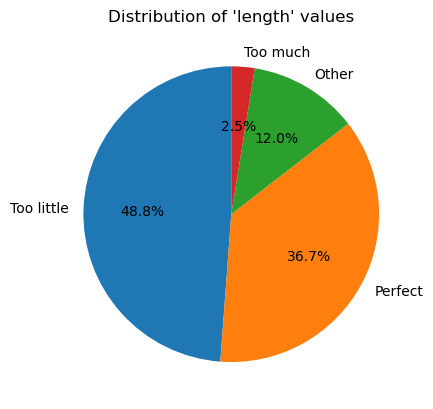

In [459]:
# Count the occurrences of each 'length' value
length_counts = date_duration['length'].value_counts()

# Create the pie chart
plt.pie(length_counts, labels=length_counts.index, autopct='%1.1f%%', startangle=90) 
plt.title("Distribution of 'length' values")
plt.show()

In [466]:
nb_dates_avis = extraction_df(df_followup_time2['numdat_2'])
nb_dates_avis = pd.concat([nb_dates_avis,df_field_sex['gender_label'],df_speed_dating['round']],axis = 1)
nb_dates_avis['numdat_2'] = nb_dates_avis['numdat_2'].fillna(4)
nb_dates_avis['numdat_2'] = nb_dates_avis['numdat_2'].map({1: 'Too few', 2: 'Too many', 3:"Perfect",4:'Other'})
nb_dates_avis = nb_dates_avis.drop_duplicates(subset='iid', keep='first').reset_index(drop=True)
nb_dates_avis

,iid,numdat_2,gender_label,round
0,1,Too few,Female,10
1,2,Other,Female,10
2,3,Other,Female,10
3,4,Too many,Female,10
4,5,Too many,Female,10
...,...,...,...,...
546,548,Too many,Male,22
547,549,Too many,Male,22
548,550,Perfect,Male,22
549,551,Too many,Male,22


In [468]:
fig = px.histogram(nb_dates_avis[nb_dates_avis["numdat_2"] != "Other"], x = "round", color = "numdat_2", text_auto=True)
fig.update_layout(title_text="Date duration")
fig.show()

On peut estimer que le nombre de date le plus plaisant se situe entre 10 et 15

# On regarde s'il y a un moment pour décrocher un date plus important que d'autre

In [962]:
df_match_time = pd.concat([df_speed_dating['round'],df_speed_dating['order'], df_speed_dating['match'],df_field_sex['gender_label']], axis=1)
df_match_time = extraction_df(df_match_time)
df_match_time = df_match_time[df_match_time["gender_label"] == "Male"]

# Je ne prends que les round >= 10 car sur round plus petits, on ne peut pas conclure
df_match_time = df_match_time[df_match_time["round"] >= 10]
df_match_time.head(10)

,iid,round,order,match,gender_label
100,11,10,4,0,Male
101,11,10,10,0,Male
102,11,10,6,0,Male
103,11,10,3,0,Male
104,11,10,1,0,Male
105,11,10,5,0,Male
106,11,10,2,0,Male
107,11,10,7,0,Male
108,11,10,8,0,Male
109,11,10,9,0,Male


In [925]:
def categorisation_time(round:int, order:int):
    # Fonction qui permet de situé le date par tiers
    moment = 100*order/round
    if moment <= 25:
        return "Quart 1"
    if moment > 75:
        return "Quart 4"
    if moment > 25 and moment <= 50:
        return "Quart 2"
    if moment > 50 and moment <= 75:
        return "Quart 3"

In [954]:
df_match_time["categorisation"] = df_match_time.apply(lambda row: categorisation_time(row["round"],row["order"]), axis = 1)
df_match_time.head(10)

,iid,round,order,match,gender_label,categorisation
100,11,10,4,0,Male,Quart 2
101,11,10,10,0,Male,Quart 4
102,11,10,6,0,Male,Quart 3
103,11,10,3,0,Male,Quart 2
104,11,10,1,0,Male,Quart 1
105,11,10,5,0,Male,Quart 2
106,11,10,2,0,Male,Quart 1
107,11,10,7,0,Male,Quart 3
108,11,10,8,0,Male,Quart 4
109,11,10,9,0,Male,Quart 4


In [955]:
df_match1_time = df_match_time[df_match_time["match"]==1]
colors = {"Quart 1" : "blue",
          "Quart 2" : "red",
          "Quart 3" : "green",
          "Quart 4" : "orange"}
          
fig = px.pie(df_match1_time,
             names="categorisation",
             color = "categorisation",
             color_discrete_map = colors)
fig.update_traces(textinfo='percent+label')  # Afficher les pourcentages et les étiquettes
fig.update_layout(title_font=dict(size=20))
fig.show()

In [930]:
fig = px.histogram(df_match1_time, x = "categorisation", color = "categorisation", text_auto=True, color_discrete_map = colors)
fig.show()

Pour les dates où il y a match, il semble préférable d'être dans le quart 2 ou 4 plutôt que le quart 3: il y a 100 matchs de plus dans ces deux zones.

In [931]:
df_match0_time = df_match_time[df_match_time["match"]==0]
fig = px.pie(df_match0_time,
             names="categorisation",
             color = "categorisation",
             color_discrete_map = colors)
fig.update_traces(textinfo='percent+label')  # Afficher les pourcentages et les étiquettes
fig.update_layout(title_font=dict(size=20))
fig.show()

In [932]:
fig = px.histogram(df_match0_time, x = "categorisation", color = "categorisation", text_auto=True, color_discrete_map = colors)
fig.show()

In [966]:
# Il faut trouver le nombre de date par order. 
nb_order = df_match_time["order"].value_counts()
nb_order

nb_order_match1 = df_match1_time["order"].value_counts()
nb_order_match0 = df_match0_time["order"].value_counts()
data = {"nb_order":nb_order,"nb_order_match1":nb_order_match1,"nb_order_match0":nb_order_match0}
df_order = pd.DataFrame(data)
df_order["Pourcentage match1"] = 100*df_order["nb_order_match1"]/df_order["nb_order"]
df_order["Pourcentage match0"] = 100*df_order["nb_order_match0"]/df_order["nb_order"]
df_order

,nb_order,nb_order_match1,nb_order_match0,Pourcentage match1,Pourcentage match0
order,,,,,
1,242,63,180,26.033058,74.380165
2,242,44,204,18.181818,84.297521
3,242,47,203,19.421488,83.884298
4,242,48,201,19.834711,83.057851
5,242,49,199,20.247934,82.231405
6,242,45,203,18.595041,83.884298
7,242,40,204,16.528926,84.297521
8,242,39,205,16.115702,84.710744
9,242,52,192,21.487603,79.338843


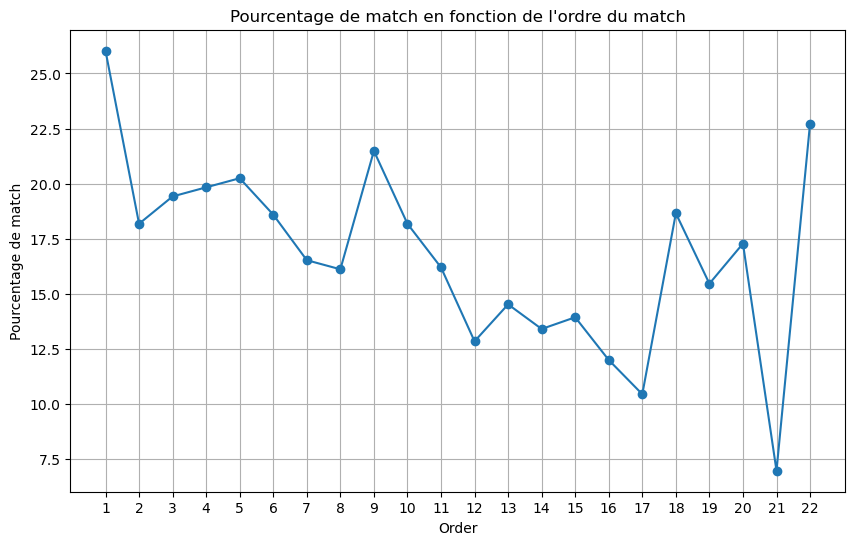

In [964]:
# Création du graphique
plt.figure(figsize=(10, 6))  # Ajustez la taille selon vos besoins
plt.plot(df_order.index, df_order['Pourcentage match1'], marker='o')

# Personnalisation du graphique
plt.xlabel('Order')
plt.ylabel('Pourcentage de match')
plt.title('Pourcentage de match en fonction de l\'ordre du match')
plt.xticks(df_order.index)  # Afficher tous les index sur l'axe x
plt.grid(True)  # Ajouter une grille (facultatif)

# Affichage du graphique
plt.show()

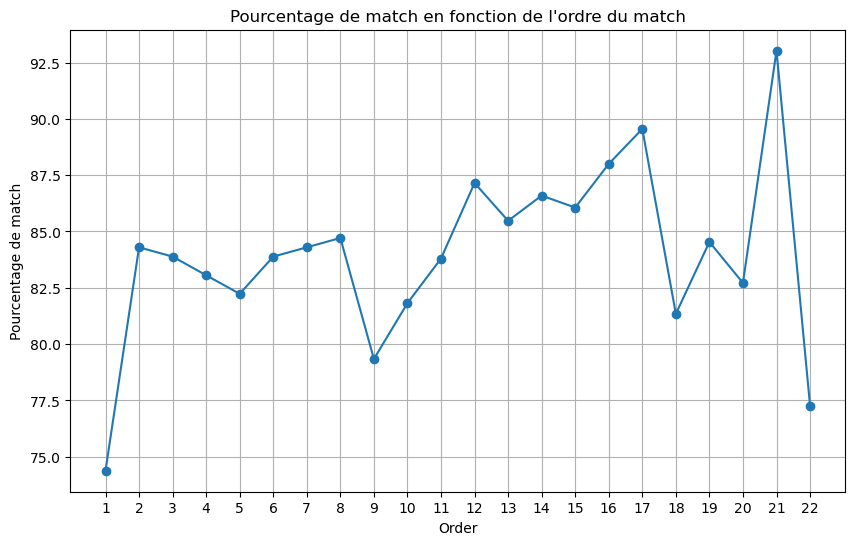

In [967]:
# Création du graphique
plt.figure(figsize=(10, 6))  # Ajustez la taille selon vos besoins
plt.plot(df_order.index, df_order['Pourcentage match0'], marker='o')

# Personnalisation du graphique
plt.xlabel('Order')
plt.ylabel('Pourcentage de match')
plt.title('Pourcentage de match en fonction de l\'ordre du match')
plt.xticks(df_order.index)  # Afficher tous les index sur l'axe x
plt.grid(True)  # Ajouter une grille (facultatif)

# Affichage du graphique
plt.show()

On remarque que le premier date est celui qui génère le plus de match

In [470]:
list_note_attributes_time2 = [elmnt + "7_2" for elmnt in list_attributes]
list_note_attributes_time2

['attr7_2', 'sinc7_2', 'intel7_2', 'fun7_2', 'amb7_2', 'shar7_2']

In [471]:
note_time2 = extraction_df(df_followup_time2.loc[:,list_note_attributes_time2])
note_time2

,iid,attr7_2,sinc7_2,intel7_2,fun7_2,amb7_2,shar7_2
0,1,NaN,NaN,NaN,NaN,NaN,NaN
1,1,NaN,NaN,NaN,NaN,NaN,NaN
2,1,NaN,NaN,NaN,NaN,NaN,NaN
3,1,NaN,NaN,NaN,NaN,NaN,NaN
4,1,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
8373,552,70.0,0.0,15.0,10.0,0.0,5.0
8374,552,70.0,0.0,15.0,10.0,0.0,5.0
8375,552,70.0,0.0,15.0,10.0,0.0,5.0
8376,552,70.0,0.0,15.0,10.0,0.0,5.0


Beaucoup trop de données vide dans note_time2, on ne peut pas travailler avec

In [475]:
df_followup_time2.describe()

,satis_2,length,numdat_2,attr7_2,sinc7_2,intel7_2,fun7_2,amb7_2,shar7_2,attr1_2,...,attr3_2,sinc3_2,intel3_2,fun3_2,amb3_2,attr5_2,sinc5_2,intel5_2,fun5_2,amb5_2
count,7463.000000,7463.000000,7433.000000,1984.000000,1955.000000,1984.000000,1984.000000,1955.000000,1974.000000,7445.000000,...,7463.000000,7463.000000,7463.000000,7463.000000,7463.000000,4377.000000,4377.000000,4377.000000,4377.000000,4377.000000
mean,5.711510,1.843495,2.338087,32.819556,13.529923,15.293851,18.868448,7.286957,12.156028,26.217194,...,7.125285,7.931529,8.238912,7.602171,7.486802,6.827964,7.394106,7.838702,7.279415,7.332191
std,1.820764,0.975662,0.631240,17.155270,7.977482,7.292868,8.535963,6.125187,8.241906,14.388694,...,1.371390,1.503236,1.180280,1.548200,1.744634,1.411096,1.588145,1.280936,1.647478,1.521854
min,1.000000,1.000000,1.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,...,2.000000,2.000000,4.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
25%,5.000000,1.000000,2.000000,20.000000,10.000000,10.000000,10.000000,0.000000,5.000000,16.670000,...,7.000000,7.000000,8.000000,7.000000,7.000000,6.000000,6.000000,7.000000,6.000000,6.000000
50%,6.000000,1.000000,2.000000,30.000000,10.000000,15.000000,20.000000,5.000000,10.000000,20.000000,...,7.000000,8.000000,8.000000,8.000000,8.000000,7.000000,8.000000,8.000000,7.000000,7.000000
75%,7.000000,3.000000,3.000000,40.000000,20.000000,20.000000,24.000000,10.000000,20.000000,30.000000,...,8.000000,9.000000,9.000000,9.000000,9.000000,8.000000,8.000000,9.000000,8.000000,8.000000
max,10.000000,3.000000,3.000000,80.000000,40.000000,50.000000,50.000000,20.000000,40.000000,85.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000


In [657]:
list_attributes_notes_time1 = [item + "7_1" for item in list_attributes]
list_attributes_personal_note = [item + "1_1" for item in list_attributes]

list_attributes_notes_time2 = [item + "7_2" for item in list_attributes]
list_attributes_personal_think_time2 = [item + "1_2" for item in list_attributes]
list_attributes_global_think_time2 = [item + "4_2" for item in list_attributes]
list_attributes_opposite_think_time2 = [item + "2_2" for item in list_attributes]
list_attributes_other_perception_time2 = [item + "5_2" for item in list_attributes]
list_attributes_measure_up_time2 = [item + "3_2" for item in list_attributes]

list_attributes_notes_time3 = [item + "7_3" for item in list_attributes]
list_attributes_personal_think_time3 = [item + "1_3" for item in list_attributes]
list_attributes_global_think_time3 = [item + "4_3" for item in list_attributes]
list_attributes_opposite_think_time3 = [item + "2_3" for item in list_attributes]
list_attributes_other_perception_time3 = [item + "5_3" for item in list_attributes]
list_attributes_measure_up_time3 = [item + "3_3" for item in list_attributes]

list_attributes_other_perception_time2.remove("shar5_2")
list_attributes_measure_up_time2.remove("shar3_2")
list_attributes_other_perception_time3.remove("shar5_3")
list_attributes_measure_up_time3.remove("shar3_3")


In [688]:
# ON crée les dataframe en isolant les données
df_date_note_time2 = df_followup_time2.loc[:,list_attributes_notes_time2]
df_points_personal_think_time2 = df_followup_time2.loc[:,list_attributes_personal_think_time2]
df_points_global_think_time2 = df_followup_time2.loc[:,list_attributes_global_think_time2]
df_points_opposite_think_time2 = df_followup_time2.loc[:,list_attributes_opposite_think_time2]
df_points_other_perception_time2 = df_followup_time2.loc[:,list_attributes_other_perception_time2]
df_points_measure_up_time2 = df_followup_time2.loc[:,list_attributes_measure_up_time2]

df_date_note_time3 = df_followup_time3.loc[:,list_attributes_notes_time3]
df_points_personal_think_time3 = df_followup_time3.loc[:,list_attributes_personal_think_time3]
df_points_global_think_time3 = df_followup_time3.loc[:,list_attributes_global_think_time3]
df_points_opposite_think_time3 = df_followup_time3.loc[:,list_attributes_opposite_think_time3]
df_points_other_perception_time3 = df_followup_time3.loc[:,list_attributes_other_perception_time3]
df_points_measure_up_time3 = df_followup_time3.loc[:,list_attributes_measure_up_time3]

In [757]:
# Comparaison de l'évolution des notes en fonction du moment où elles ont été répondues
df_date_note_time1

,attr7_1,sinc7_1,intel7_1,fun7_1,amb7_1,shar7_1
0,60.0,90.0,70.0,70.0,60.0,50.0
1,70.0,80.0,70.0,80.0,50.0,60.0
2,50.0,80.0,90.0,80.0,50.0,70.0
3,70.0,60.0,80.0,70.0,60.0,80.0
4,50.0,60.0,70.0,70.0,60.0,60.0
...,...,...,...,...,...,...
8373,30.0,50.0,50.0,50.0,NaN,NaN
8374,40.0,60.0,80.0,40.0,40.0,NaN
8375,40.0,70.0,80.0,80.0,80.0,NaN
8376,40.0,60.0,50.0,40.0,NaN,50.0


In [758]:
df_date_note_time1 = df_scorecard.loc[:,list_attributes]
df_date_note_time1 = df_date_note_time1.apply(lambda x: x * 10)
for idx, name in enumerate(list_attributes_notes_time1):
    df_date_note_time1 = df_date_note_time1.rename(columns={list_attributes[idx]:name})
df_date_note_time1

,attr7_1,sinc7_1,intel7_1,fun7_1,amb7_1,shar7_1
0,60.0,90.0,70.0,70.0,60.0,50.0
1,70.0,80.0,70.0,80.0,50.0,60.0
2,50.0,80.0,90.0,80.0,50.0,70.0
3,70.0,60.0,80.0,70.0,60.0,80.0
4,50.0,60.0,70.0,70.0,60.0,60.0
...,...,...,...,...,...,...
8373,30.0,50.0,50.0,50.0,NaN,NaN
8374,40.0,60.0,80.0,40.0,40.0,NaN
8375,40.0,70.0,80.0,80.0,80.0,NaN
8376,40.0,60.0,50.0,40.0,NaN,50.0


In [676]:
print(df_date_note_time1.shape)
print(df_date_note_time2.shape)
print(df_date_note_time3.shape)

(8378, 6)
(8378, 6)
(8378, 6)


In [684]:
mask_T2 = df_date_note_time2.isnull()
mask_T3 = df_date_note_time3.isnull()
mask_T3

,attr7_3,sinc7_3,intel7_3,fun7_3,amb7_3,shar7_3
0,True,True,True,True,True,True
1,True,True,True,True,True,True
2,True,True,True,True,True,True
3,True,True,True,True,True,True
4,True,True,True,True,True,True
...,...,...,...,...,...,...
8373,False,False,False,False,False,False
8374,False,False,False,False,False,False
8375,False,False,False,False,False,False
8376,False,False,False,False,False,False


In [727]:
df_date_note_time4 = df_date_note_time2
df_date_note_time5 = df_date_note_time3
df_date_note_time6 = df_date_note_time1
for idx, name in enumerate(list_attributes):
    df_date_note_time4 = df_date_note_time4.rename(columns={list_attributes_notes_time2[idx]:name})
    df_date_note_time5 = df_date_note_time5.rename(columns={list_attributes_notes_time3[idx]:name})
    df_date_note_time6 = df_date_note_time6.rename(columns={list_attributes_notes_time1[idx]:name})
df_date_note_time6 = df_date_note_time6.fillna(0)

df_date_note_time4 = df_date_note_time4.where(~mask_T2, df_date_note_time6)
df_date_note_time5 = df_date_note_time5.where(~mask_T3, df_date_note_time6)


for idx, name in enumerate(list_attributes_notes_time1):
    df_date_note_time6 = df_date_note_time6.rename(columns={list_attributes[idx]:name})

for idx, name in enumerate(list_attributes_notes_time2):
    df_date_note_time4 = df_date_note_time4.rename(columns={list_attributes[idx]:name})

for idx, name in enumerate(list_attributes_notes_time3):
    df_date_note_time5 = df_date_note_time5.rename(columns={list_attributes[idx]:name})


In [728]:
df_date_note_time4

,attr7_2,sinc7_2,intel7_2,fun7_2,amb7_2,shar7_2
0,60.0,90.0,70.0,70.0,60.0,50.0
1,70.0,80.0,70.0,80.0,50.0,60.0
2,50.0,80.0,90.0,80.0,50.0,70.0
3,70.0,60.0,80.0,70.0,60.0,80.0
4,50.0,60.0,70.0,70.0,60.0,60.0
...,...,...,...,...,...,...
8373,30.0,50.0,50.0,50.0,0.0,0.0
8374,40.0,60.0,80.0,40.0,40.0,0.0
8375,40.0,70.0,80.0,80.0,80.0,0.0
8376,40.0,60.0,50.0,40.0,0.0,50.0


In [729]:
df_date_note_time5

,attr7_3,sinc7_3,intel7_3,fun7_3,amb7_3,shar7_3
0,60.0,90.0,70.0,70.0,60.0,50.0
1,70.0,80.0,70.0,80.0,50.0,60.0
2,50.0,80.0,90.0,80.0,50.0,70.0
3,70.0,60.0,80.0,70.0,60.0,80.0
4,50.0,60.0,70.0,70.0,60.0,60.0
...,...,...,...,...,...,...
8373,30.0,50.0,50.0,50.0,0.0,0.0
8374,40.0,60.0,80.0,40.0,40.0,0.0
8375,40.0,70.0,80.0,80.0,80.0,0.0
8376,40.0,60.0,50.0,40.0,0.0,50.0


In [730]:
# Concaténer les DataFrames
df_date_note_time_concat = pd.concat([df_date_note_time6, df_date_note_time4,df_date_note_time5,df_scorecard.loc[:,"dec"]], axis=1)
# df_date_note_time_concat = df_date_note_time_concat.fillna(0)


In [731]:
df_date_note_time_concat

,attr7_1,sinc7_1,intel7_1,fun7_1,amb7_1,shar7_1,attr7_2,sinc7_2,intel7_2,fun7_2,amb7_2,shar7_2,attr7_3,sinc7_3,intel7_3,fun7_3,amb7_3,shar7_3,dec
0,60.0,90.0,70.0,70.0,60.0,50.0,60.0,90.0,70.0,70.0,60.0,50.0,60.0,90.0,70.0,70.0,60.0,50.0,1
1,70.0,80.0,70.0,80.0,50.0,60.0,70.0,80.0,70.0,80.0,50.0,60.0,70.0,80.0,70.0,80.0,50.0,60.0,1
2,50.0,80.0,90.0,80.0,50.0,70.0,50.0,80.0,90.0,80.0,50.0,70.0,50.0,80.0,90.0,80.0,50.0,70.0,1
3,70.0,60.0,80.0,70.0,60.0,80.0,70.0,60.0,80.0,70.0,60.0,80.0,70.0,60.0,80.0,70.0,60.0,80.0,1
4,50.0,60.0,70.0,70.0,60.0,60.0,50.0,60.0,70.0,70.0,60.0,60.0,50.0,60.0,70.0,70.0,60.0,60.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8373,30.0,50.0,50.0,50.0,0.0,0.0,30.0,50.0,50.0,50.0,0.0,0.0,30.0,50.0,50.0,50.0,0.0,0.0,0
8374,40.0,60.0,80.0,40.0,40.0,0.0,40.0,60.0,80.0,40.0,40.0,0.0,40.0,60.0,80.0,40.0,40.0,0.0,0
8375,40.0,70.0,80.0,80.0,80.0,0.0,40.0,70.0,80.0,80.0,80.0,0.0,40.0,70.0,80.0,80.0,80.0,0.0,0
8376,40.0,60.0,50.0,40.0,0.0,50.0,40.0,60.0,50.0,40.0,0.0,50.0,40.0,60.0,50.0,40.0,0.0,50.0,0


In [659]:
df_personal_think_opposite_sex = df_signup_timel.loc[:,list_attributes_personal_note]
df_personal_think_opposite_sex

,attr1_1,sinc1_1,intel1_1,fun1_1,amb1_1,shar1_1
0,15.0,20.0,20.0,15.0,15.0,15.0
1,15.0,20.0,20.0,15.0,15.0,15.0
2,15.0,20.0,20.0,15.0,15.0,15.0
3,15.0,20.0,20.0,15.0,15.0,15.0
4,15.0,20.0,20.0,15.0,15.0,15.0
...,...,...,...,...,...,...
8373,70.0,0.0,15.0,15.0,0.0,0.0
8374,70.0,0.0,15.0,15.0,0.0,0.0
8375,70.0,0.0,15.0,15.0,0.0,0.0
8376,70.0,0.0,15.0,15.0,0.0,0.0


In [732]:
# Calculer la moyenne de chaque attribut pour chaque temps
vector_T1T2 = {}
vector_T2T3 = {}
list_attr1 = [[list_attributes[i] + "7_1",list_attributes[i] + "7_2"] for i in range(6)]
list_attr2 = [[list_attributes[i] + "7_2",list_attributes[i] + "7_3"] for i in range(6)]
for i in range(6):
    vector_T1T2[list_attributes[i]] = df_date_note_time_concat.loc[:,list_attr1[i][0]] - df_date_note_time_concat.loc[:,list_attr1[i][1]]
    vector_T2T3[list_attributes[i]] = df_date_note_time_concat.loc[:,list_attr2[i][0]] - df_date_note_time_concat.loc[:,list_attr2[i][1]]

df_vector_T1T2 = pd.DataFrame.from_dict(vector_T1T2, orient='columns')
df_vector_T2T3 = pd.DataFrame.from_dict(vector_T2T3, orient='columns')


In [733]:
df_vector_T1T2

,attr,sinc,intel,fun,amb,shar
0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...
8373,0.0,0.0,0.0,0.0,0.0,0.0
8374,0.0,0.0,0.0,0.0,0.0,0.0
8375,0.0,0.0,0.0,0.0,0.0,0.0
8376,0.0,0.0,0.0,0.0,0.0,0.0


    REPONSE AUX QUESTIONS DE JULIE

Are shared interests more important than a shared racial background?

In [734]:
# On récupère dans un df la colonne "imprace"
df_importance_origine_ethnique = df_signup_timel.loc[:,"imprace"]
df_importance_origine_ethnique

0       2.0
1       2.0
2       2.0
3       2.0
4       2.0
       ... 
8373    1.0
8374    1.0
8375    1.0
8376    1.0
8377    1.0
Name: imprace, Length: 8378, dtype: float64

In [786]:
df_dec_date = df_scorecard.loc[:,"dec"]
df_same_race = df_speed_dating.loc[:,"samerace"]

In [841]:
# df_same_race_dec permet de voir l'iid, la decision, si les deux dates sont de meme origine, importance de l'origine pour chacun et la note donnée par date
df_same_race_dec = pd.concat([df_dec_date,df_same_race,df_importance_origine_ethnique,df_date_note_time6["shar7_1"].apply(lambda x: x / 10)], axis = 1)
df_same_race_dec = extraction_df(df_same_race_dec)
df_same_race_dec['samerace_label'] = df_same_race_dec['samerace'].map({1: 'Same race', 0: 'Different race'})

# Tri sur la valeur de decision
df_same_race_dec1 = df_same_race_dec[df_same_race_dec["dec"] ==1]
df_same_race_dec0 = df_same_race_dec[df_same_race_dec["dec"] ==0]

# df_race_shar_comp: False si la note imprace est inférieure à shar7_1
df_race_shar_comp = df_dec_date
tempo = df_same_race_dec["imprace"] > df_same_race_dec["shar7_1"]
df_race_shar_comp = pd.concat([df_race_shar_comp,tempo], axis = 1)
df_race_shar_comp = df_race_shar_comp.rename(columns={0:"Comparaison"})
df_race_shar_comp


,dec,Comparaison
0,1,False
1,1,False
2,1,False
3,1,False
4,1,False
...,...,...
8373,0,True
8374,0,True
8375,0,True
8376,0,False


On regarde si la note donnée pour imprace concorde avec la réalité.

In [838]:
# On regarde par iid le pourcentage de dec = 1 avec samerace = 1.
dict_note_shar_race = {}
for group, df in df_same_race_dec.groupby("iid"):
    nb_same_race = df["samerace"].sum()
    nb_date = df["samerace"].count()
    nb_dec1 = df["dec"].sum()
    iid = group
    # print(iid)

    note_moy_shar_dec1 = df[df["dec"]==1]["shar7_1"].mean()
    note_moy_shar_dec0 = df[df["dec"]==0]["shar7_1"].mean()

    dict_note_shar_race[iid] = [note_moy_shar_dec0,note_moy_shar_dec1]
    if group == 3:
        print(df)
    # print(note_moy_shar_dec1)
    
    # break

    iid  dec  samerace  imprace  shar7_1  samerace_label
20    3    0         1      8.0      9.0       Same race
21    3    0         1      8.0      7.0       Same race
22    3    0         0      8.0      7.0  Different race
23    3    0         1      8.0      7.0       Same race
24    3    0         0      8.0     10.0  Different race
25    3    0         1      8.0      9.0       Same race
26    3    0         1      8.0      9.0       Same race
27    3    0         1      8.0      7.0       Same race
28    3    0         1      8.0      9.0       Same race
29    3    0         1      8.0      7.0       Same race


In [839]:
df_note_shar_race = pd.DataFrame.from_dict(dict_note_shar_race, orient = 'index')
df_note_shar_race = df_note_shar_race.fillna(0)
df_note_shar_race

,0,1
1,5.000000,6.875000
2,4.666667,7.250000
3,8.100000,0.000000
4,6.428571,8.666667
5,5.000000,7.000000
...,...,...
548,1.307692,4.000000
549,5.076923,6.000000
550,3.933333,4.857143
551,4.857143,5.625000


In [798]:
df_race_shar_comp = df_race_shar_comp.replace({True:"Race > Shar", False: "Shar > Race"})

In [799]:
fig = px.histogram(df_race_shar_comp, x = "dec",color = "Comparaison", text_auto=True)
fig.show()

# False : shar > imprace

On remarque que:
1. Une note supérieure de shar sur race donne autant de oui que de non
2. Pour une décision OUI, on 4 fois plus de shar superieure à race que l'inverse.

On peut faire un donut chart

In [845]:
def categorie_race_shar(a:int ,b:bool):
    
    if a == 1:
        if b: return 'Dec 1, Race>Shar'   # Cas dec = 1 et comparaison = True
        else: return 'Dec 1, Shar>Race'   # Cas dec = 1 et comparaison = False

    else:
        if b: return 'Dec 0, Race>Shar'   # Cas dec = 0 et comparaison = True
        else: return 'Dec 0, Shar>Race'   # Cas dec = 0 et comparaison = False

df_race_shar_comp['Categorie'] = df_race_shar_comp.apply(lambda row: categorie_race_shar(row['dec'],row['Comparaison']), axis=1)
df_race_shar_comp

,dec,Comparaison,Categorie
0,1,False,"Dec 1, Shar>Race"
1,1,False,"Dec 1, Shar>Race"
2,1,False,"Dec 1, Shar>Race"
3,1,False,"Dec 1, Shar>Race"
4,1,False,"Dec 1, Shar>Race"
...,...,...,...
8373,0,True,"Dec 0, Race>Shar"
8374,0,True,"Dec 0, Race>Shar"
8375,0,True,"Dec 0, Race>Shar"
8376,0,False,"Dec 0, Shar>Race"


In [848]:
fig = px.pie(df_race_shar_comp, names= "Categorie", hole=.3)
fig.update_traces(textinfo='percent+label')  # Afficher les pourcentages et les étiquettes
fig.update_layout(title_font=dict(size=20))
fig.show()

62 % des personnes donnent shar > à race.